## Assessment 1: Deep Learning

1) Answer all questions.
2) This assessment is open-book. You are allowed to refer to any references including online materials, books, notes, codes, github links, etc.
3) Copy this notebook to your google drive (click **FILE** > **save a copy in Drive**)
4) Upload the answer notebook to your github. 
5) Submit the assessment by sharing the link to your answer notebook. 





**QUESTION 1** 

One day while wandering around a clothing store at KL East Mall, you stumbled upon a pretty girl who is choosing a dress for Hari Raya. It turns out that the girl is visually impaired and had a hard time distinguishing between an abaya and a kebaya. To help people with the similar situation, you then decided to develop an AI system to identify the type of clothes using a Convolutional Neural Networks (ConvNet). In order to train the network, you decide to use the Fashion MNIST dataset which is freely available on Pytorch.


a) Given the problem, what is the most appropriate loss function to use? Justify your answer. **[5 marks]**


<span style="color:blue">
    ANSWER: Binary Cross Entropy Loss. Binary cross entropy compares each of the predicted probabilities to actual class output which can be either 0 or 1. Therefore, in this case either abaya or kebaya. It then calculates the score that penalizes the probabilities based on the distance from the expected value. That means how close or far from the actual value
    Next, cross entropy is used because it is equivalent to fitting the model using maximum likelihood estimation. This on the other hand can be interpreted as minimizing the dissimilarity between the empirical distribution of training data and the the distribution induced by the model. Maximum Likelihood estimators have nice asymptotical properties and they are consistent yet statistically efficient.
    Furthermore, directly optimizing the cross-entropy leads naturally to well-calibrated probabilities. That means you can interpret the resulting probabilities as you would expect, namely that of all the cases with about x% predicted probability, x% should belong to the positive class.
    Last but not least, given the prevalence of gradient-based learning algorithms, the logarithm in the cross-entropy will undo any exponential behavior that is often given through popular activation/output units like the sigmoid/softmax. Thus, the logarithm will avoid that the gradient saturates for extreme values. So, this loss function is very suitable to use in an AI system in order to help the girl distinguish between the abaya and kebaya

b) Create and train a ConvNet corresponding to the following CNN architecture (with a modification of the final layer to address the number of classes). Please include **[10 marks]**:

    1) The dataloader to load the train and test datasets.

    2) The model definition (either using sequential method OR pytorch class method).

    3) Define your training loop.

    4) Output the mean accuracy for the whole testing dataset.

    

<div>
<img src="https://vitalflux.com/wp-content/uploads/2021/11/VGG16-CNN-Architecture.png" width="550"/>
</div>


In [1]:
import torch, torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import time
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import glob
import numpy
import random

from PIL import Image
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import datasets, models, transforms
from torchsummary import summary
import torchvision.transforms as transforms

image_transforms = {
    'train': transforms.Compose([
        transforms.Resize(size=32), #due to time constraint, I use size=32
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.repeat(3, 1, 1) if x.size(0)==1 else x),
        transforms.Normalize([0.5, 0.5, 0.5],
                             [0.5, 0.5, 0.5])
    ]),
    'test': transforms.Compose([
        transforms.Resize(size=32),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.repeat(3, 1, 1) if x.size(0)==1 else x),
        transforms.Normalize([0.5, 0.5, 0.5],
                             [0.5, 0.5, 0.5])
    ])
}

batch_size = 16


trainset = torchvision.datasets.FashionMNIST(root='./data', train=True,
                                        download=True, transform=image_transforms['train'])
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True)

testset = torchvision.datasets.FashionMNIST(root='./data', train=False,
                                       download=True, transform=image_transforms['test'])
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False)

classes = ['T-shirt/top','Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot'] #class=10

train_data_size = len(trainloader.dataset)
test_data_size = len(testloader.dataset)

print(train_data_size)
print(test_data_size)


  0%|          | 0/26421880 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/29515 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/4422102 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/5148 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw

60000
10000


In [2]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        '''self.pool = nn.MaxPool2d(2, 2) #since I use size=32, I have to reduce the convolutional layer from 5 to 2, otherwise, the image will be too small.
        self.conv3 = nn.Conv2d(128, 256, 1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv4 = nn.Conv2d(256, 512, 1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv5 = nn.Conv2d(512, 512, 1)
        self.pool = nn.MaxPool2d(2, 2)'''
        self.fc1 = nn.Linear(16 * 5 * 5, 200)
        self.fc2 = nn.Linear(200, 100)
        self.fc3 = nn.Linear(100, 10)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        '''x = self.pool(self.relu(self.conv3(x)))
        x = self.pool(self.relu(self.conv4(x)))
        x = self.pool(self.relu(self.conv5(x)))'''
        #print(x.shape)
        x = x.view(-1, 16 * 5 * 5)
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.fc3(x)
        return x

model = CNN()

In [3]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model.to(device)

CNN(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=400, out_features=200, bias=True)
  (fc2): Linear(in_features=200, out_features=100, bias=True)
  (fc3): Linear(in_features=100, out_features=10, bias=True)
  (relu): ReLU()
)

In [4]:
import time # to calculate training time

def train_and_validate(model, loss_criterion, optimizer, epochs=25):
    '''
    Function to train and validate
    Parameters
        :param model: Model to train and validate
        :param loss_criterion: Loss Criterion to minimize
        :param optimizer: Optimizer for computing gradients
        :param epochs: Number of epochs (default=25)
  
    Returns
        model: Trained Model with best validation accuracy
        history: (dict object): Having training loss, accuracy and validation loss, accuracy
    '''
    
    start = time.time()
    history = []
    best_acc = 0.0

    for epoch in range(epochs):
        epoch_start = time.time()
        print("Epoch: {}/{}".format(epoch+1, epochs))
        
        # Set to training mode
        model.train()
        
        # Loss and Accuracy within the epoch
        train_loss = 0.0
        train_acc = 0.0
        
        valid_loss = 0.0
        valid_acc = 0.0
        
        for i, (inputs, labels) in enumerate(trainloader):

            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # Clean existing gradients
            optimizer.zero_grad()
            
            # Forward pass - compute outputs on input data using the model
            outputs = model(inputs)
            
            # Compute loss
            loss = loss_criterion(outputs, labels)
            
            # Backpropagate the gradients
            loss.backward()
            
            # Update the parameters
            optimizer.step()
            
            # Compute the total loss for the batch and add it to train_loss
            train_loss += loss.item() * inputs.size(0)
            
            # Compute the accuracy
            ret, predictions = torch.max(outputs.data, 1)
            correct_counts = predictions.eq(labels.data.view_as(predictions))
            
            # Convert correct_counts to float and then compute the mean
            acc = torch.mean(correct_counts.type(torch.FloatTensor))
            
            # Compute total accuracy in the whole batch and add to train_acc
            train_acc += acc.item() * inputs.size(0)
            
            #print("Batch number: {:03d}, Training: Loss: {:.4f}, Accuracy: {:.4f}".format(i, loss.item(), acc.item()))

            
        # Validation - No gradient tracking needed
        with torch.no_grad():

            # Set to evaluation mode
            model.eval()

            # Validation loop
            for j, (inputs, labels) in enumerate(testloader):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Forward pass - compute outputs on input data using the model
                outputs = model(inputs)

                # Compute loss
                loss = loss_criterion(outputs, labels)

                # Compute the total loss for the batch and add it to valid_loss
                valid_loss += loss.item() * inputs.size(0)

                # Calculate validation accuracy
                ret, predictions = torch.max(outputs.data, 1)
                correct_counts = predictions.eq(labels.data.view_as(predictions))

                # Convert correct_counts to float and then compute the mean
                acc = torch.mean(correct_counts.type(torch.FloatTensor))

                # Compute total accuracy in the whole batch and add to valid_acc
                valid_acc += acc.item() * inputs.size(0)

                #print("Validation Batch number: {:03d}, Validation: Loss: {:.4f}, Accuracy: {:.4f}".format(j, loss.item(), acc.item()))
            
        # Find average training loss and training accuracy
        avg_train_loss = train_loss/train_data_size 
        avg_train_acc = train_acc/train_data_size

        # Find average training loss and training accuracy
        avg_test_loss = valid_loss/test_data_size 
        avg_test_acc = valid_acc/test_data_size

        history.append([avg_train_loss, avg_test_loss, avg_train_acc, avg_test_acc])
                
        epoch_end = time.time()
    
        print("Epoch : {:03d}, Training: Loss: {:.4f}, Accuracy: {:.4f}%, \n\t\tValidation : Loss : {:.4f}, Accuracy: {:.4f}%, Time: {:.4f}s".format(epoch, avg_train_loss, avg_train_acc*100, avg_test_loss, avg_test_acc*100, epoch_end-epoch_start))
        
        # Save if the model has best accuracy till now
        torch.save(model, 'fashion_mnist_model'+str(epoch)+'.pt')
            
    return model, history

In [5]:
num_epochs = 10
trained_model, history = train_and_validate(model, criterion, optimizer, num_epochs)

Epoch: 1/10
Epoch : 000, Training: Loss: 0.4639, Accuracy: 82.8783%, 
		Validation : Loss : 0.3588, Accuracy: 86.8800%, Time: 34.9383s
Epoch: 2/10
Epoch : 001, Training: Loss: 0.3238, Accuracy: 88.2267%, 
		Validation : Loss : 0.3309, Accuracy: 88.1900%, Time: 27.4370s
Epoch: 3/10
Epoch : 002, Training: Loss: 0.2855, Accuracy: 89.5400%, 
		Validation : Loss : 0.3461, Accuracy: 87.1100%, Time: 27.4495s
Epoch: 4/10
Epoch : 003, Training: Loss: 0.2589, Accuracy: 90.4667%, 
		Validation : Loss : 0.2967, Accuracy: 89.3800%, Time: 27.7284s
Epoch: 5/10
Epoch : 004, Training: Loss: 0.2387, Accuracy: 91.1567%, 
		Validation : Loss : 0.2993, Accuracy: 89.6800%, Time: 27.3679s
Epoch: 6/10
Epoch : 005, Training: Loss: 0.2222, Accuracy: 91.7050%, 
		Validation : Loss : 0.2819, Accuracy: 90.3700%, Time: 27.6501s
Epoch: 7/10
Epoch : 006, Training: Loss: 0.2068, Accuracy: 92.1700%, 
		Validation : Loss : 0.3544, Accuracy: 87.7200%, Time: 26.9141s
Epoch: 8/10
Epoch : 007, Training: Loss: 0.1928, Accura

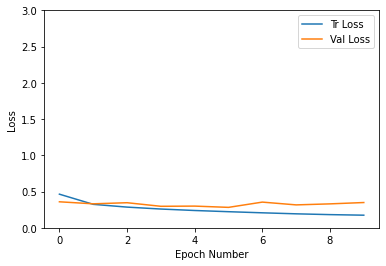

In [6]:
#Model loss
history = np.array(history)
plt.plot(history[:,0:2])
plt.legend(['Tr Loss', 'Val Loss'])
plt.xlabel('Epoch Number')
plt.ylabel('Loss')
plt.ylim(0,3)
plt.show()

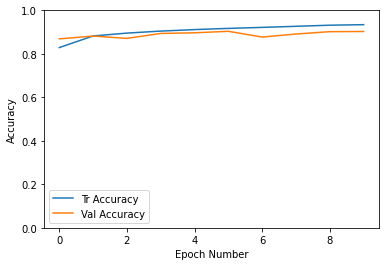

In [7]:
#Model Accuracy
plt.plot(history[:,2:4])
plt.legend(['Tr Accuracy', 'Val Accuracy'])
plt.xlabel('Epoch Number')
plt.ylabel('Accuracy')
plt.ylim(0,1)
# plt.savefig('cifar10_accuracy_curve.png')
plt.show()

c) Replace your defined CNN in b) with a pre-trained model. Then, proceed with a transfer learning and finetune the model for the Fashion MNIST dataset. **[10 marks]**

In [ ]:
model_2 = models.resnet34(pretrained=True)
num_ftrs = model_2.fc.in_features
model_2.fc = nn.Linear(num_ftrs, 10)

model2 = model_2.to(device)

criterion = nn.CrossEntropyLoss()

optimizer_ft = optim.Adam(model2.parameters(), lr=0.001)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

In [ ]:
num_epochs = 10
trained_model_2, history_2 = train_and_validate(model2, criterion, optimizer_ft, num_epochs)

Epoch: 1/10
Epoch : 000, Training: Loss: 0.4985, Accuracy: 83.0133%, 
		Validation : Loss : 0.3035, Accuracy: 88.7200%, Time: 125.4924s
Epoch: 2/10
Epoch : 001, Training: Loss: 0.3548, Accuracy: 87.7183%, 
		Validation : Loss : 0.3106, Accuracy: 88.6600%, Time: 124.8393s
Epoch: 3/10
Epoch : 002, Training: Loss: 0.2946, Accuracy: 89.8067%, 
		Validation : Loss : 0.2875, Accuracy: 89.6800%, Time: 124.7354s
Epoch: 4/10
Epoch : 003, Training: Loss: 0.2770, Accuracy: 90.3667%, 
		Validation : Loss : 0.2851, Accuracy: 89.3700%, Time: 125.7039s
Epoch: 5/10
Epoch : 004, Training: Loss: 0.2432, Accuracy: 91.4550%, 
		Validation : Loss : 0.3482, Accuracy: 88.8100%, Time: 124.3316s
Epoch: 6/10
Epoch : 005, Training: Loss: 0.2217, Accuracy: 92.1317%, 
		Validation : Loss : 0.7922, Accuracy: 87.6200%, Time: 124.6894s
Epoch: 7/10
Epoch : 006, Training: Loss: 0.2021, Accuracy: 92.8467%, 
		Validation : Loss : 0.2390, Accuracy: 91.3300%, Time: 125.3712s
Epoch: 8/10
Epoch : 007, Training: Loss: 0.1822,

d) Using model-centric methods, propose two (2) strategies that can be used to increase the accuracy of the model on the testing dataset. [5 marks]

Two model-centric techniques that I propose are: add more hidden layer. add Dropout with 50%

e) Next, implement the two proposed model-centric techniques for the same problem as in the previous question. **[15 marks]**

In [ ]:
model_conv = torchvision.models.resnet152(pretrained=True)
for param in model_conv.parameters():
    param.requires_grad = False

#Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
print(num_ftrs)
model_conv.fc = nn.Sequential(nn.Linear(num_ftrs, (num_ftrs//2)),nn.ReLU(),
                            nn.Linear((num_ftrs//2), (num_ftrs//4)), nn.ReLU(),
                            nn.Linear((num_ftrs//4), (num_ftrs//8)), nn.ReLU(),
                            nn.Linear((num_ftrs//8), (num_ftrs//16)), nn.ReLU(), nn.Droput(0.5),
                            nn.Linear((num_ftrs//16),10)
                            )

model_conv.to(device)
criterion = nn.CrossEntropyLoss()

optimizer = optim.SGD(model_conv.parameters(), lr=0.001, momentum=0.9)


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


2048


In [ ]:
num_epochs = 10
trained_model_3, history_3 = train_and_validate(model_conv, criterion, optimizer, num_epochs)

Epoch: 1/10
Epoch : 000, Training: Loss: 1.4936, Accuracy: 45.8867%, 
		Validation : Loss : 3.3355, Accuracy: 69.2000%, Time: 133.0851s
Epoch: 2/10
Epoch : 001, Training: Loss: 0.8537, Accuracy: 69.4033%, 
		Validation : Loss : 5.3597, Accuracy: 72.3700%, Time: 132.9111s
Epoch: 3/10
Epoch : 002, Training: Loss: 0.7633, Accuracy: 72.2450%, 
		Validation : Loss : 6.0236, Accuracy: 71.9300%, Time: 133.1226s
Epoch: 4/10
Epoch : 003, Training: Loss: 0.7198, Accuracy: 73.8400%, 
		Validation : Loss : 4.4125, Accuracy: 74.3500%, Time: 133.6799s
Epoch: 5/10
Epoch : 004, Training: Loss: 0.6896, Accuracy: 74.9567%, 
		Validation : Loss : 6.0711, Accuracy: 73.6700%, Time: 133.8658s
Epoch: 6/10
Epoch : 005, Training: Loss: 0.6656, Accuracy: 75.6283%, 
		Validation : Loss : 3.2896, Accuracy: 76.3600%, Time: 133.7427s
Epoch: 7/10
Epoch : 006, Training: Loss: 0.6491, Accuracy: 76.2183%, 
		Validation : Loss : 2.1381, Accuracy: 74.7300%, Time: 132.5991s
Epoch: 8/10
Epoch : 007, Training: Loss: 0.6313,

f) Do you see any accuracy improvement? Whether it is a "yes" or "no", discuss the possible reasons contributing to the accuracy improvement/ unimprovement. **[5 marks]**

<span style="color:blue">
    No. The percentage of the accuracy becomes lower than before. It is because the model has many layer and too complex. Thus, the percentage of the model becomes lower


g) In real applications, data-centric strategies are essential to train robust deep learning models. Give two (2) examples of such strategies and discuss how the strategies helps improving the model accuracy. **[5 marks]**

<span style="color:blue">
    Your answer here 1) Data augmentation. It can be use to prevent overfitting, or the initial dataset is too small to train on, or if we want to squeeze better performance from the model. We can apply various changes to the initial data. For example, for images we can use:
Geometric transformations – you can randomly flip, crop, rotate or translate images, and that is just the tip of the iceberg
Color space transformations – change RGB color channels, intensify any color
Kernel filters – sharpen or blur an image
Random Erasing – delete a part of the initial image
Mixing images – basically, mix images with one another. Might be counterintuitive but it works
     2) Albumentation

h) Next, implement the two proposed data-centric techniques for the same problem as in the previous question. **[10 marks]**

In [ ]:
#Data augmentation
#I use RandomRotation and GaussianBlur
image_transforms_2 = {
    'train': transforms.Compose([
        transforms.RandomRotation(degrees=15),
        transforms.RandomHorizontalFlip(),
        transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5],
                             [0.5, 0.5, 0.5])
    ]),

    'test': transforms.Compose([
        transforms.ToTensor(),
        transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
        transforms.Normalize([0.5, 0.5, 0.5],
                             [0.5, 0.5, 0.5])
        
    ])
}

batch_size = 16

trainset2 = torchvision.datasets.FashionMNIST(root='./data', train=True,
                                        download=True, transform=image_transforms_2['train'])
trainloader2 = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True)

testset2 = torchvision.datasets.FashionMNIST(root='./data', train=False,
                                       download=True, transform=image_transforms_2['test'])
testloader2 = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False)

classes = ['T-shirt/top','Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

train_data_size = len(trainloader.dataset)
test_data_size = len(testloader.dataset)

print(train_data_size)
print(test_data_size)

60000
10000


In [ ]:
num_epochs = 10
trained_model_3, history_3 = train_and_validate(model_conv, criterion, optimizer, num_epochs)

Epoch: 1/10
Epoch : 000, Training: Loss: 0.5967, Accuracy: 78.1767%, 
		Validation : Loss : 1.5004, Accuracy: 78.9000%, Time: 134.2676s
Epoch: 2/10
Epoch : 001, Training: Loss: 0.5835, Accuracy: 78.3800%, 
		Validation : Loss : 1.0690, Accuracy: 78.2600%, Time: 135.0408s
Epoch: 3/10
Epoch : 002, Training: Loss: 0.5834, Accuracy: 78.6117%, 
		Validation : Loss : 1.2561, Accuracy: 77.4900%, Time: 133.9346s
Epoch: 4/10
Epoch : 003, Training: Loss: 0.5765, Accuracy: 78.6200%, 
		Validation : Loss : 2.3898, Accuracy: 76.2300%, Time: 133.5897s
Epoch: 5/10
Epoch : 004, Training: Loss: 0.5693, Accuracy: 78.9217%, 
		Validation : Loss : 0.9640, Accuracy: 78.9600%, Time: 134.2519s
Epoch: 6/10
Epoch : 005, Training: Loss: 0.5663, Accuracy: 79.1300%, 
		Validation : Loss : 0.7642, Accuracy: 79.7900%, Time: 133.5242s
Epoch: 7/10
Epoch : 006, Training: Loss: 0.5508, Accuracy: 79.6450%, 
		Validation : Loss : 1.6861, Accuracy: 79.0400%, Time: 133.2438s
Epoch: 8/10
Epoch : 007, Training: Loss: 0.5519,

**QUESTION 2** **[35 marks]**

Firstly, watch this video:

https://drive.google.com/file/d/1bsypahR7I3f_R3DXkfw_tf0BrbCHxE_O/view?usp=sharing

This video shows an example of masked face recognition where the deep learning model is able to detect and classify your face even when wearing a face mask. Using the end-to-end object detection pipeline that you have learned, develop your own masked face recognition such that the model should recognize your face even on face mask while recognize other persons as "others".

Deliverables for this question are:

- the model file. Change the name to <your_name>.pt file (e.g. hasan.pt).
- a short video (~10 secs) containing your face and your friends faces (for inference).

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 12351, done.
remote: Counting objects: 100% (142/142), done.
remote: Compressing objects: 100% (91/91), done.
remote: Total 12351 (delta 86), reused 95 (delta 51), pack-reused 12209
Receiving objects: 100% (12351/12351), 12.41 MiB | 7.62 MiB/s, done.
Resolving deltas: 100% (8448/8448), done.
/content/yolov5
     |████████████████████████████████| 596 kB 3.5 MB/s 
     |████████████████████████████████| 1.1 MB 9.9 MB/s 
     |████████████████████████████████| 21.6 MB 103.3 MB/s 
     |████████████████████████████████| 67 kB 6.3 MB/s 
     |████████████████████████████████| 145 kB 69.3 MB/s 
     |████████████████████████████████| 4.3 MB 42.9 MB/s 
     |████████████████████████████████| 138 kB 72.8 MB/s 
     |████████████████████████████████| 178 kB 56.3 MB/s 
     |████████████████████████████████| 54 kB 3.2 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
ERROR: pip's dependency resolver does not currently take into a

In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="qz3klMn8qCfs7mRRElA5")
project = rf.workspace("kptpace").project("facemask-detection-83fyr")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/facemask-detection-1 in yolov5pytorch:: 100%|██████████| 448/448 [00:00<00:00, 1399.08it/s]


In [ ]:
!python train.py --img 416 --batch 16 --epochs 30 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/facemask-detection-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-347-g7b9cc32 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0,

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/facemask-detection-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-347-g7b9cc32 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/23 /content/datasets/facemask-detection-1/test/images/WIN_20220801_14_55_31_Pro_jpg.rf.668e3ab97655b7bf3976f57e5d4bdabd.jpg: 288x416 1 me, 2 otherss, Done. (0.012s)
image 2/23 /content/datasets/facemask-detection-1/test/images/WIN_20220801_14_55_32_Pro_jpg.rf.b04e40c1abbc6907d49d42769502098c.jpg: 288x416 1 me, 2 otherss,

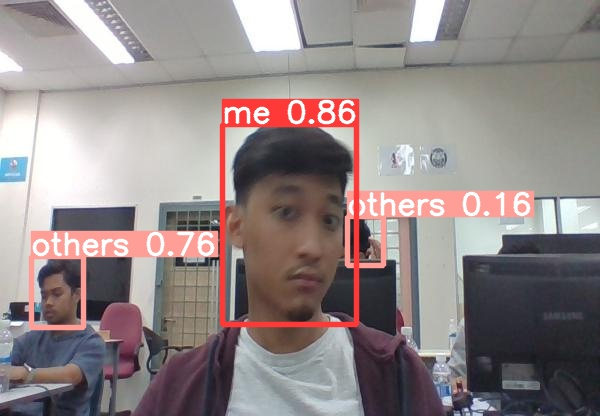

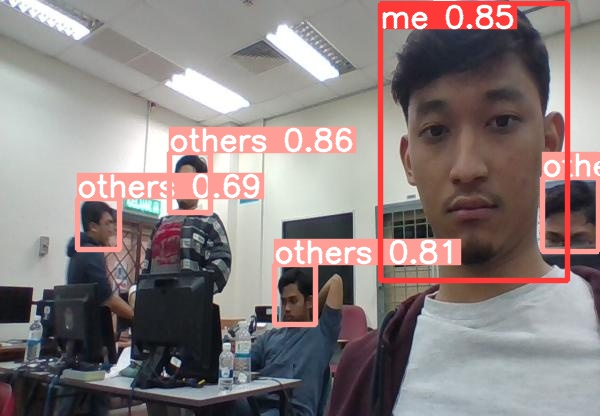

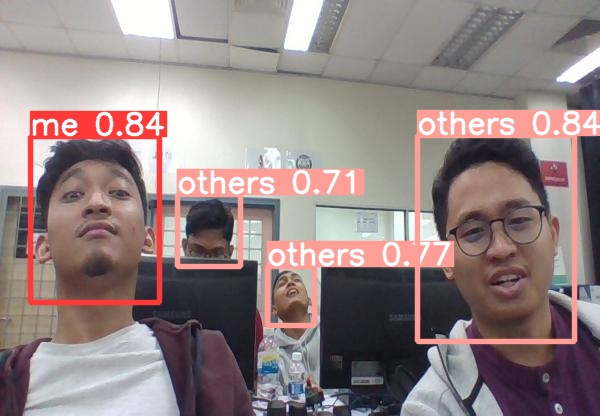

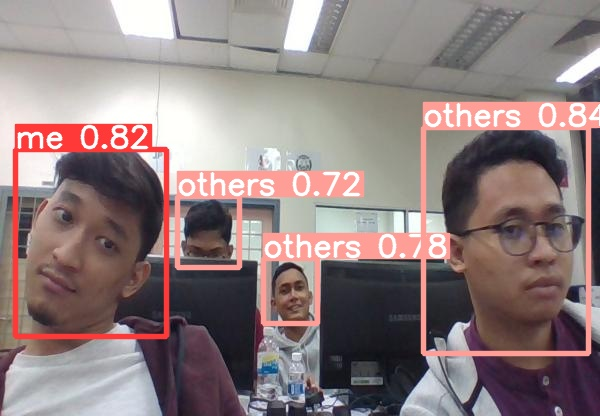

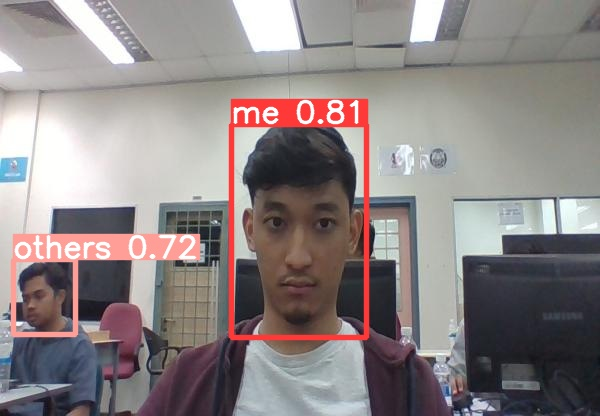

...

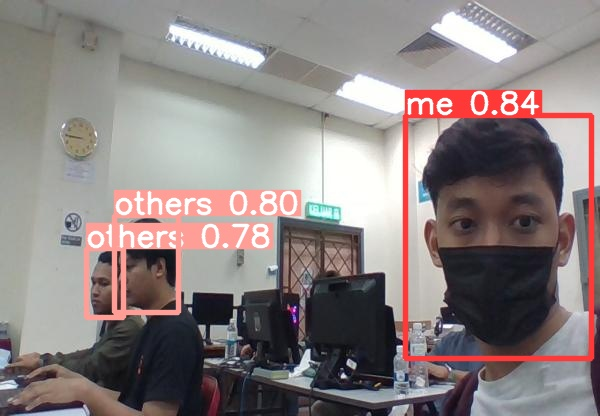

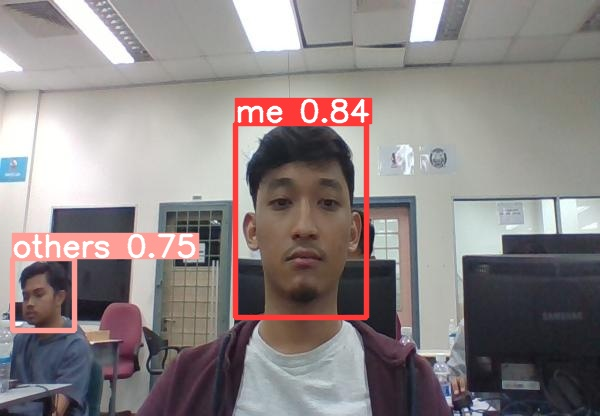

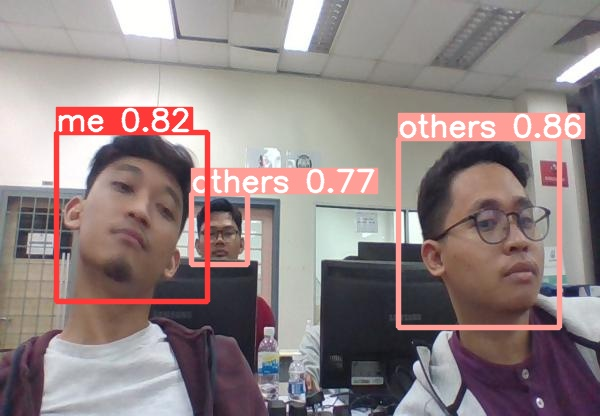

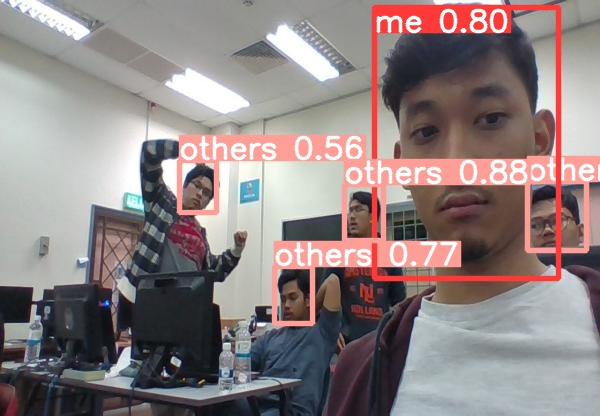

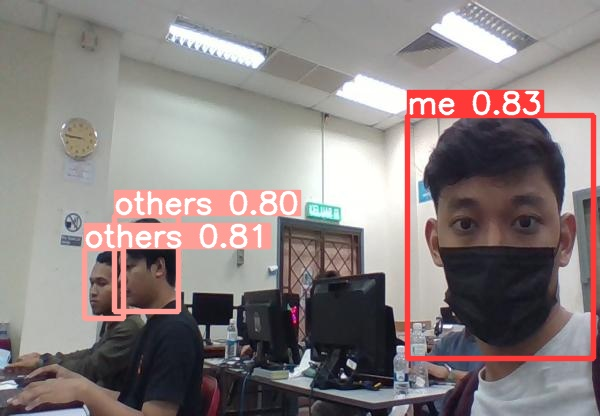

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>